<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 15px; height: 80px">

# Project 6


## NLP and Machine Learning on [travel.statsexchange.com](http://travel.stackexchange.com/) data

---

In Project 7 you'll be doing NLP and machine learning on post data from stackexchange's travel subdomain. 

This project is setup like a mini Kaggle competition. You are given the training data and when projects are submitted your model will be tested on the held-out testing data. There will be prizes for the people who build models that perform best on the held out test set!

---

## Notes on the data

The data is again compressed into the `.7z` file format to save space. There are 6 .csv files and one readme file that contains some information on the fields.

    posts_train.csv
    comments_train.csv
    users.csv
    badges.csv
    votes_train.csv
    tags.csv
    readme.txt
    
The data is located in your datasets folder:

    DSI-SF-2/datasets/stack_exchange_travel.7z
    
If you're interested in where this data came from and where to get more data from other stackexchange subdomains, see here:

https://ia800500.us.archive.org/22/items/stackexchange/readme.txt


### Recommended Utilities for .7z

- For OSX [Keka](http://www.kekaosx.com/en/) or [The Unarchiver](http://wakaba.c3.cx/s/apps/unarchiver.html). 
- For Windows [7-zip](http://www.7-zip.org/) is the standard. 
- For Linux try the `p7zip` utility.  `sudo apt-get install p7zip`.



In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

plt.style.use('fivethirtyeight')
%matplotlib inline

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

### 1. Use LDA to find what topics are discussed on travel.stackexchange.com.

---

Text can be found in the posts and the comments datasets. The `ParentId` column in the posts dataset indicates what the "question" post was for a given post. Comment text can be merged onto the post they are part of with the `PostId` field.

The text may have some HTML tags. BeautifulSoup has convenient ways to get rid of markup or extract text if you need to. You can also parse the strings yourself if you like.

The tags dataset has the "tags" that the users have officially given the post.

**1.1 Implement LDA against the text features of the dataset(s).**

- This can be posts or a combination of posts and comments if you want more power.
- Find optimal **K/num_topics**.

**1.2 Compare your topics to the tags. Do the LDA topics make sense? How do they compare to the tags?**


<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

### 2. What makes an answer likely to be "accepted"?

---

**2.1 Build a model to predict whether a post will be marked as the answer.**

- This is a classification problem.
- You're free to use any of the machine learning algorithms or techniques we have learned in class to build the best model you can.
- NLP will be very useful here for pulling out useful and relevant features from the data. 
- Though not required, using bagging and boosting models like Random Forests and Gradient Boosted Trees will _probably_ get you the highest performance on the test data (but who knows!).


**2.2 Evaluate the performance of your classifier with a confusion matrix and accuracy. Explain how your model is performing.**

**2.3 Plot either a ROC curve or precision-recall curve (or both!) and explain what they tell you about your model.**

NOTE: You should only be predicting this for `PostTypeID=2` posts, which are the "answer" posts. This doesn't mean, however, that you can't or shouldn't use the parent questions as predictors!


<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

### 3. What is the score of a post?

---

**3.1 Build a model that predicts the score of a post.**

- This is a regression problem now. 
- You can and should be predicting score for both "question" and "answer" posts, so keep them both in your dataset.
- Again, use any techniques that you think will get you the best model.

**3.2 Evaluate the performance of your model with cross-validation and report the results.**

**3.3 What is important for determining the score of a post, if anything?**


<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

### 4. How many views does a post have?

---

**4.1 Build a model that predicts the number of views a post has.**

- This is another regression problem. 
- Predict the views for all posts, not just the "answer" posts.

**4.2 Evaluate the performance of your model with cross-validation and report the results.**

**4.3 What is important for the number of views a post has, if anything?**

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

### 5. Build a pipeline or other code to automate evaluation of your models on the test data.

---

Now that you've constructed your three predictive models, build a pipeline or code that can easily load up the raw testing data and evaluate your models on it.

The testing data that is held out is in the same raw format as the training data you have. _Any cleaning and preprocessing that you did on the training data will need to be done on the testing data as well!_

This is a good opportunity to practice building pipelines, but you're not required to. Custom functions and classes are fine as long as they are able to process and test the new data.


<img src="http://imgur.com/xDpSobf.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 6. Lets Model - Tournament for stock market predictions

>Start this section of the project by downloading the train and test datasets from the following site: https://numer.ai/rules

> - The data set is clean, your goal is to develop a classification model(s) 
> - Report all the results including log loss, and other coefficients you consider iteresting

In [16]:
numerai = pd.read_csv('numerai_datasets/numerai_training_data.csv')
print numerai.shape

# only we 5% of data
sample = numerai.sample(frac=0.05)
print sample.shape

(96320, 22)
(4816, 22)


In [17]:
numerai.describe().T

,count,mean,std,min,25%,50%,75%,max
feature1,96320.0,0.510907,0.285408,0.000080,0.274338,0.516491,0.756597,1.0
feature2,96320.0,0.509350,0.291167,0.000000,0.269589,0.501874,0.760481,1.0
feature3,96320.0,0.508976,0.289229,0.000004,0.259184,0.521147,0.753798,1.0
feature4,96320.0,0.495767,0.290997,0.000000,0.249903,0.486466,0.752731,1.0
feature5,96320.0,0.489782,0.291474,0.000000,0.236166,0.472627,0.746591,1.0
feature6,96320.0,0.493086,0.286879,0.000000,0.239905,0.490490,0.738235,1.0
feature7,96320.0,0.492942,0.293921,0.000000,0.248836,0.481355,0.759485,1.0
feature8,96320.0,0.498414,0.289632,0.000000,0.254630,0.503693,0.747866,1.0
feature9,96320.0,0.509350,0.290065,0.000000,0.268449,0.501750,0.765690,1.0
feature10,96320.0,0.492729,0.287546,0.000000,0.250234,0.489029,0.749962,1.0


In [18]:
sample.describe().T

,count,mean,std,min,25%,50%,75%,max
feature1,4816.0,0.505781,0.284274,0.000080,0.263534,0.510555,0.750436,1.0
feature2,4816.0,0.502263,0.288707,0.000071,0.268378,0.492512,0.747666,1.0
feature3,4816.0,0.504622,0.287869,0.000004,0.254449,0.510176,0.746897,1.0
feature4,4816.0,0.498893,0.292285,0.000151,0.249504,0.491057,0.757446,1.0
feature5,4816.0,0.491402,0.289635,0.000134,0.237755,0.475896,0.742986,1.0
feature6,4816.0,0.490477,0.287477,0.000003,0.233415,0.490490,0.737765,1.0
feature7,4816.0,0.491978,0.293507,0.000026,0.249649,0.477020,0.759048,1.0
feature8,4816.0,0.489876,0.288174,0.000099,0.252941,0.484529,0.733831,1.0
feature9,4816.0,0.506501,0.289446,0.001127,0.263562,0.500291,0.765961,1.0
feature10,4816.0,0.488304,0.289275,0.000132,0.240228,0.480808,0.752880,1.0


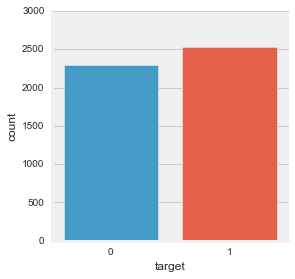

In [20]:
sns.factorplot('target',data=sample,kind='count')

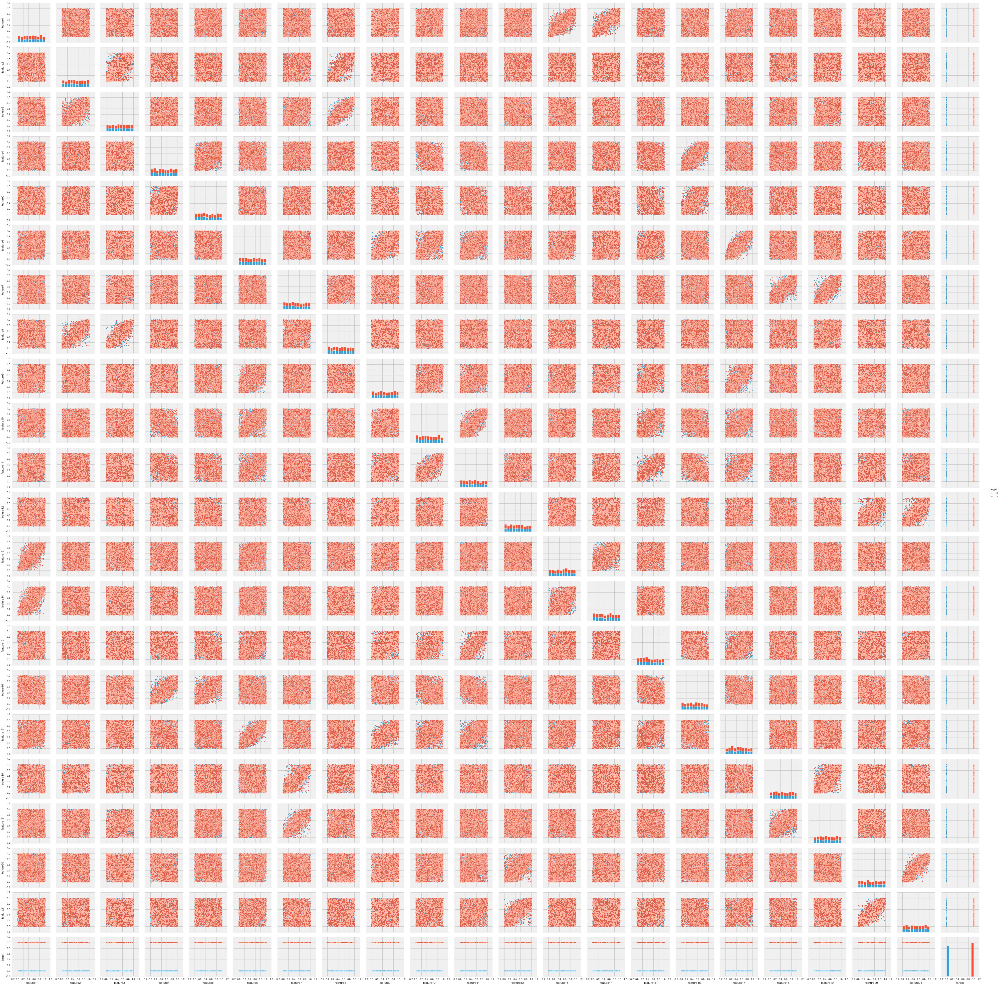

In [21]:
sns.pairplot(sample,hue='target')

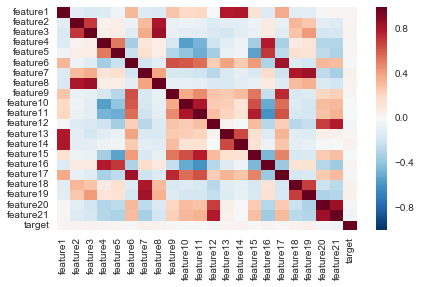

In [22]:
corr = sample.corr()
sns.heatmap(corr)

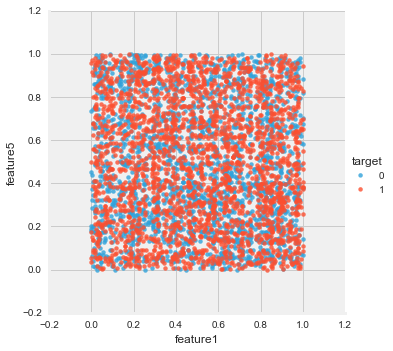

In [23]:
sns.lmplot('feature1', 'feature5',sample, hue='target',fit_reg=False)

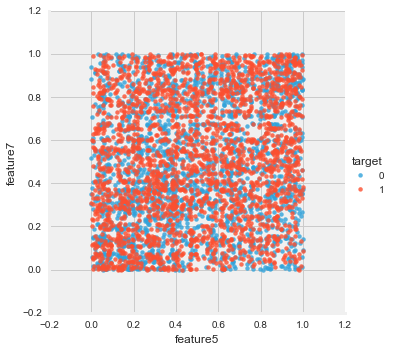

In [24]:
sns.lmplot('feature5', 'feature7',sample, hue='target',fit_reg=False)

In [25]:
sample.target.mean()

0.5240863787375415

In [26]:
X = sample.ix[:,:-1]
y = sample.ix[:,-1]
print X.shape, y.shape

(4816, 21) (4816L,)


In [27]:
# PCA
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA, SparsePCA, KernelPCA
from mpl_toolkits.mplot3d import Axes3D

In [28]:
SS = StandardScaler()
Z = SS.fit_transform(X)
print Z.mean().mean(), Z.std().mean()

4.65447083572e-17 1.0


In [35]:
def draw_3d_pca(Z, y, pca_model, title='PCA n = 3'):
    
    U = pca_model.fit_transform(Z)
    u0 = U[np.ravel(np.where(y==0)),:] 
    u1 = U[np.ravel(np.where(y==1)),:]
    
    fig = plt.figure(1, figsize=(8, 6))
    ax = Axes3D(fig, elev=-150, azim=110)
    ax.scatter(u0[:, 1], u0[:, 0], u0[:, 2], c='b', cmap=plt.cm.Paired, label='y = 0')
    ax.scatter(u1[:, 1], u1[:, 0], u1[:, 2], c='r', cmap=plt.cm.Paired, label='y = 1')
    ax.set_title(title)
    ax.set_xlabel("1st eigenvector")
    ax.set_ylabel("2nd eigenvector")
    ax.set_zlabel("3rd eigenvector")
    plt.legend(loc='upper left')

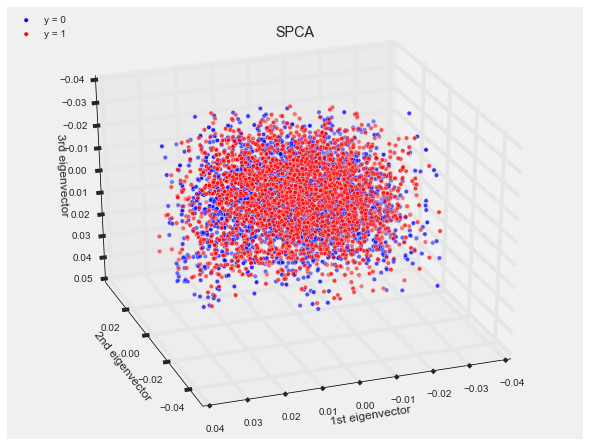

In [36]:
spca = SparsePCA(n_components=3,alpha=1)
draw_3d_pca(Z, y, spca,'SPCA')

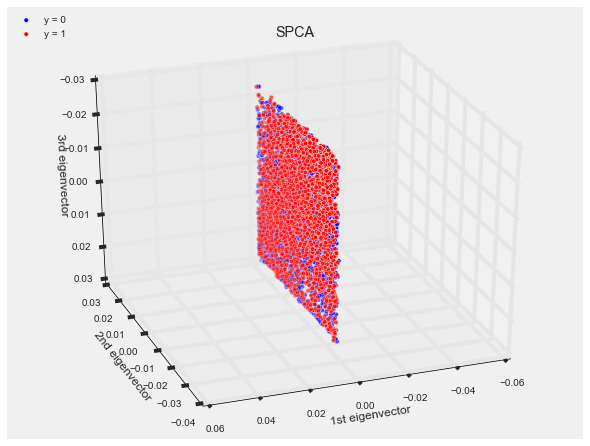

In [37]:
spca = SparsePCA(n_components=3,alpha=50)
draw_3d_pca(Z, y, spca,'SPCA')

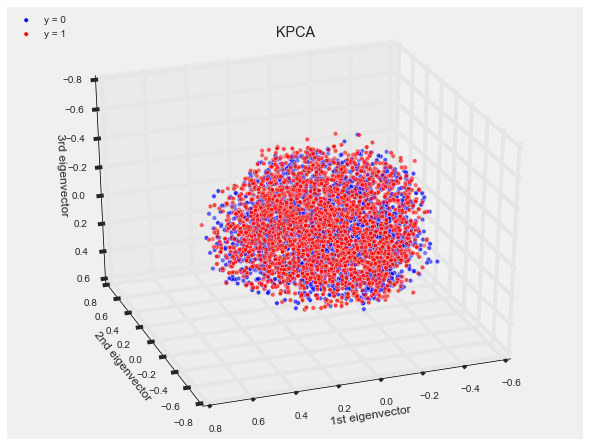

In [38]:
kpca = KernelPCA(n_components=3,kernel='rbf')
draw_3d_pca(Z, y, kpca,'KPCA')

In [39]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import log_loss

In [43]:
model_compare = {}

def model_eval(gs_object, label):
    gs_object
    
    params = gs_object.best_params_
    score =  gs_object.best_score_
    y_prob = gs_object.best_estimator_.predict_log_proba(Z)
    logloss = log_loss(y, y_prob)
    
    model_compare[label] = {
        'params': str(params),
        'acc_score': score,
        'log_loss': logloss
    }

In [41]:
params = {}
clf = GaussianNB()
gs_NB = GridSearchCV(clf,params, n_jobs=-1, cv=10)
gs_NB.fit(Z, y)

GridSearchCV(cv=10, error_score='raise', estimator=GaussianNB(priors=None),
       fit_params={}, iid=True, n_jobs=-1, param_grid={},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=0)

In [53]:
# random forest

params = {'n_estimators':[3, 10, 30, 100, 300],
          'criterion': ['gini', 'entropy'],
          'max_depth': [None, 5, 10, 15, 20],
          'min_samples_split': [2,5],
          'class_weight':[None, 'balanced']}

clf = RandomForestClassifier(n_jobs=-1)
gs_RF = GridSearchCV(clf,params, n_jobs=-1, cv=10)
gs_RF.fit(Z, y)

GridSearchCV(cv=10, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=-1, oob_score=False, random_state=None,
            verbose=0, warm_start=False),
       fit_params={}, iid=True, n_jobs=-1,
       param_grid={'n_estimators': [3, 10, 30, 100, 300], 'min_samples_split': [2, 5], 'criterion': ['gini', 'entropy'], 'max_depth': [None, 5, 10, 15, 20], 'class_weight': [None, 'balanced']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=0)

In [44]:
# fit again with Z
params = {'C': [10 ** n for n in range(-3, 4)],
          'penalty': ['l1', 'l2']}

clf = LogisticRegression(n_jobs=-1)
gs_LR = GridSearchCV(clf, params, n_jobs=-1, cv=10)
gs_LR.fit(Z, y)

GridSearchCV(cv=10, error_score='raise',
       estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=-1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False),
       fit_params={}, iid=True, n_jobs=-1,
       param_grid={'penalty': ['l1', 'l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=0)

In [45]:
params = {
          'n_estimators':[3, 10, 30, 100, 300],
          'learning_rate': [0.1, 1.0, 3, 10]
         }

clf = AdaBoostClassifier()
gs_adb = GridSearchCV(clf, params, n_jobs=-1, cv=10)
gs_adb.fit(Z, y)

GridSearchCV(cv=10, error_score='raise',
       estimator=AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=50, random_state=None),
       fit_params={}, iid=True, n_jobs=-1,
       param_grid={'n_estimators': [3, 10, 30, 100, 300], 'learning_rate': [0.1, 1.0, 3, 10]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=0)

In [56]:
model_eval(gs_NB, 'Naive Bayes')
model_eval(gs_LR, 'Linear Regression')
#model_eval(gs_RF, 'Random Forest')
model_eval(gs_adb, 'AdaBoost')

In [57]:
model_compare['Guess'] = {
    'params': '{}',
    'acc_score': y.mean(),
    'log_loss': log_loss(y, np.ones(len(y))*0.5)
}

#del model_compare['All as 1']
#del model_compare['All as 0']

In [58]:
pd.DataFrame(model_compare).T.sort_values('log_loss',ascending=False)

,acc_score,log_loss,params
AdaBoost,0.540698,0.693147,"{'n_estimators': 100, 'learning_rate': 0.1}"
Guess,0.524086,0.693147,{}
Linear Regression,0.524917,0.693147,"{'penalty': 'l2', 'C': 0.001}"
Naive Bayes,0.527824,0.693147,{}


### Uploading predictions
To upload your predictions, login and click the Upload Predictions button on the leaderboard. The format of your prediction upload should be a CSV file with two columns:t_id and probability. The probability column is the probability estimated by your model of the observation being of class 1.

In [59]:
numerai_tn = pd.read_csv('numerai_datasets/numerai_tournament_data.csv')
print numerai_tn.shape
numerai_tn.head(2)

(135281, 22)


,t_id,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,...,feature12,feature13,feature14,feature15,feature16,feature17,feature18,feature19,feature20,feature21
0,112195,0.581007,0.908596,0.766110,0.844650,0.247000,0.600018,0.827638,0.726782,0.596622,...,0.772935,0.083463,0.537761,0.613012,0.672179,0.422369,0.727817,0.884887,0.267128,0.352174
1,96496,0.050758,0.905095,0.966358,0.991736,0.637117,0.956871,0.804695,0.994215,0.967192,...,0.429742,0.054114,0.066266,0.715163,0.796705,0.826976,0.734355,0.805943,0.832481,0.659629


In [60]:
submit = pd.DataFrame(numerai_tn.t_id)
X_tn = numerai_tn.ix[:, 1:]
Z_tn = SS.transform(X_tn)
print Z_tn.mean().mean(), Z_tn.std().mean()

0.00660074975565 0.999262286675


In [61]:
predicting_model = gs_adb.best_estimator_

y_prob_tn = predicting_model.predict_proba(Z_tn)[:,1]
y_tn = predicting_model.predict(Z_tn)

for p, pred in zip(y_prob_tn,y_tn)[:10]:
    print (p, pred)

(0.50370840750264112, 1)
(0.50480903773510344, 1)
(0.5028037899921709, 1)
(0.50316377503120446, 1)
(0.50370840750264112, 1)
(0.48993724222294116, 0)
(0.51451306819599163, 1)
(0.50341882635757029, 1)
(0.50064494148897176, 1)
(0.50186962334414809, 1)


In [62]:
submit['probability'] = y_prob_tn
submit.head(10)

,t_id,probability
0,112195,0.503708
1,96496,0.504809
2,96608,0.502804
3,24379,0.503164
4,107328,0.503708
5,116693,0.489937
6,98659,0.514513
7,111698,0.503419
8,56585,0.500645
9,21775,0.501870


In [63]:
submit.to_csv('08JC.csv',index=False)

In [64]:
bagging_params = {'n_estimators': [10, 20],
                  'max_samples': [0.7, 1.0],
                  'max_features': [0.7, 1.0],
                  'bootstrap_features': [True, False]}

In [9]:
def b_search_recursive(x, arr):
    
    print arr
    
    if not arr:
        return arr
    else:
        m = len(arr) / 2
        if m == 0 and arr[m] != x:
            return False
        elif arr[m] == x:
            return True
        elif arr[m] > x:
            return b_search_recursive(x, arr[:m])
        else:
            return b_search_recursive(x, arr[m + 1:])

In [14]:
arr = sorted(np.random.randint(1,100,20))
x = 50 #np.random.randint(1,100)
print x
print arr

50
[14, 17, 19, 34, 39, 45, 46, 47, 50, 56, 57, 60, 66, 74, 79, 83, 83, 85, 89, 95]


In [15]:
b_search_recursive(x, arr)

[14, 17, 19, 34, 39, 45, 46, 47, 50, 56, 57, 60, 66, 74, 79, 83, 83, 85, 89, 95]
[14, 17, 19, 34, 39, 45, 46, 47, 50, 56]
[46, 47, 50, 56]


True

In [ ]:
32 

1 32 
2 16
4 8
8 4
16 2